# Setup and Install

In [ ]:
import os
import glob
import shutil
import random
import gc
from collections import Counter
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import torch
from ultralytics import YOLO, RTDETR, settings
from IPython.display import Image, display
from google.colab import drive
from roboflow import Roboflow
import datetime

In [ ]:
!pip install -q roboflow ultralytics

drive.mount('/content/drive') 

drive_project_root = '/content/drive/MyDrive/Deep_Learning'
drive_weights_dir = os.path.join(drive_project_root, 'weights')
drive_runs_dir = os.path.join(drive_project_root, 'runs')

# Create directories if they don't exist
os.makedirs(drive_weights_dir, exist_ok=True)
os.makedirs(drive_runs_dir, exist_ok=True)

print(f" Setup Complete. GPU Available: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"   GPU Name: {torch.cuda.get_device_name(0)}")

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
 Setup Complete. GPU Available: True
   GPU Name: NVIDIA A100-SXM4-40GB


# Download and Merge Datasets

In [ ]:
settings.update({'datasets_dir': '/content/datasets'}) # Set datasets directory to Colab local disk for speed at first

def download_data_fast():
    print(" Downloading dataset from Roboflow to local Colab disk")

    rf = Roboflow(api_key="8gFJp7Eu2sWslubjUHwI") # API Key from Roboflow
    project = rf.workspace("visualizan2").project("c1-zhnfm")
    version = project.version(1)

    dataset = version.download("yolov11") # Download in YOLOv11 format

    print(f" Dataset ready at: {dataset.location}")
    return dataset, f"{dataset.location}/data.yaml"


# Execute Download
dataset_obj, data_yaml_path = download_data_fast()

custom_dataset = '/content/custom_dataset' # Path to local dataset we add in Colab

def merge_datasets(source_root, target_root):
    # Iterate through 'train', 'valid', and 'test' sets
    for subset in ['train', 'valid', 'test']:
        for folder in ['images', 'labels']:
            source_dir = os.path.join(source_root, subset, folder)
            target_dir = os.path.join(target_root, subset, folder)

            # Check if source directory exists
            if os.path.exists(source_dir) and os.path.exists(target_dir):
                files = os.listdir(source_dir)

                for file_name in files:
                    full_file_name = os.path.join(source_dir, file_name)
                    if os.path.isfile(full_file_name):
                        shutil.copy(full_file_name, target_dir)
            else:
                pass

# Check if manual path exists and run the merge
if os.path.exists(custom_dataset):
    merge_datasets(custom_dataset, dataset_obj.location)
else:
    print(f"WARNING: local dataset path not found: {custom_dataset}. Proceeding with Roboflow data only.")


loading Roboflow workspace...
loading Roboflow project...
 Dataset ready at: /content/C1-1


## Only Use The Half of The Data

In [ ]:
# Define dataset paths
dataset_root = os.path.dirname(data_yaml_path)
train_images_path = os.path.join(dataset_root, 'train', 'images')
train_labels_path = os.path.join(dataset_root, 'train', 'labels')

# List all training images
all_images = glob.glob(os.path.join(train_images_path, '*.jpg')) + \
             glob.glob(os.path.join(train_images_path, '*.png')) + \
             glob.glob(os.path.join(train_images_path, '*.jpeg'))

print(f"Original Training Set Size: {len(all_images)} images")

# Select %50 of images to delete
percent_to_keep = 0.5
random.seed(42)
random.shuffle(all_images)

num_to_delete = int(len(all_images) * (1 - percent_to_keep))
images_to_delete = all_images[:num_to_delete]

print(f"Images to delete: {len(images_to_delete)} (Remaining: {len(all_images) - len(images_to_delete)})")

# Delete images and corresponding labels
for img_path in images_to_delete:
    try:
        # Remove image
        os.remove(img_path)

        # Remove corresponding label file
        label_name = os.path.basename(img_path).rsplit('.', 1)[0] + '.txt'
        label_path = os.path.join(train_labels_path, label_name)

        if os.path.exists(label_path):
            os.remove(label_path)

    except OSError as e:
        print(f"Error: Could not delete {img_path}. {e}")

print("Dataset successfully reduced by 50%. Ready for training.")

Original Training Set Size: 3416 images
Images to delete: 1708 (Remaining: 1708)
Dataset successfully reduced by 50%. Ready for training.


# Train RT-DETR for 50 Epochs with image size 320

In [ ]:
model_type = 'rtdetr-l.pt'
epochs = 50                 
batch_size = 16           
img_size = 320

timestamp = datetime.datetime.now().strftime("%Y%m%d_%H%M") # Timestamp for unique run name
run_name = f"chess_rtdetr_l_{timestamp}"

print(f"\n{'='*20} Starting Training: {run_name} {'='*20}")

if torch.cuda.is_available():
    torch.cuda.empty_cache() # Clear GPU cache before training

model = RTDETR(model_type)

# Train
results = model.train(
    data=data_yaml_path,
    epochs=epochs,
    imgsz=img_size,
    batch=batch_size,
    optimizer='AdamW',
    lr0=0.0001,
    cos_lr=True,
    project='/content/runs/detect',
    name=run_name,
    seed=42,
    patience=10,
    plots=True,
    exist_ok=True,
    workers=16
)

print(f"Training Finished. Results saved locally to /content/runs/detect/{run_name}")


==================== Starting Training: chess_rtdetr_l_20251231_1551 ====================
New https://pypi.org/project/ultralytics/8.3.244 available 😃 Update with 'pip install -U ultralytics'
Ultralytics 8.3.243 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=True, cutmix=0.0, data=/content/C1-1/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=True, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=320, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=rtde

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       1/50      10.5G      1.227     0.9009     0.3593        390        320: 100% ━━━━━━━━━━━━ 107/107 2.0it/s 52.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 4.7it/s 13.1s
                   all       1960      43525   0.000933     0.0682     0.0014   0.000442

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       2/50      11.6G      1.037      0.935     0.2561        439        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       2/50      12.2G     0.9182     0.9754     0.1921        301        320: 100% ━━━━━━━━━━━━ 107/107 2.9it/s 37.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.6it/s 9.4s
                   all       1960      43525    0.00168     0.0707    0.00269    0.00122

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       3/50      12.2G     0.9067     0.9498     0.1593        668        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       3/50      12.2G     0.8939     0.9917     0.1719        407        320: 100% ━━━━━━━━━━━━ 107/107 2.9it/s 36.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.6it/s 9.4s
                   all       1960      43525    0.00142     0.0685    0.00353    0.00107

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       4/50      12.2G     0.8079      1.147     0.1681        325        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       4/50      13.1G     0.6827      1.215     0.1367        352        320: 100% ━━━━━━━━━━━━ 107/107 2.9it/s 36.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.5it/s 9.6s
                   all       1960      43525      0.085      0.073     0.0046    0.00249

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       5/50      13.1G     0.7044      1.196     0.1476        529        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       5/50      13.1G     0.6262      1.272     0.1275        296        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.4it/s 9.7s
                   all       1960      43525      0.589     0.0497    0.00886    0.00485

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       6/50      13.1G      0.643       1.16     0.1111        590        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       6/50      13.1G     0.6043      1.226     0.1186        231        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.0s
                   all       1960      43525      0.106      0.184     0.0242     0.0142

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       7/50      13.1G     0.6833      1.383     0.1761        294        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       7/50      13.1G     0.5912      1.154      0.118        368        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 9.9s
                   all       1960      43525     0.0386      0.252     0.0307     0.0188

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       8/50      13.1G     0.6087      1.137     0.1342        500        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       8/50      13.1G     0.5786      1.123     0.1146        378        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.1s
                   all       1960      43525      0.129      0.288     0.0372      0.023

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
       9/50      13.1G      0.544      1.068     0.1084        578        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


       9/50      13.1G     0.5656       1.09       0.11        321        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.0s
                   all       1960      43525     0.0585      0.323     0.0457     0.0287

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      10/50      13.1G     0.5967      1.064     0.1359        589        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      10/50      13.1G     0.5673       1.05     0.1098        477        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.1s
                   all       1960      43525     0.0688      0.332     0.0513     0.0321

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      11/50      13.1G     0.5234      1.069    0.09231        450        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      11/50      13.1G     0.5535      1.038     0.1091        354        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.1s
                   all       1960      43525     0.0778      0.358     0.0552     0.0341

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      12/50      13.1G     0.6387     0.9626     0.1274        571        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      12/50      13.1G     0.5618      1.029     0.1113        259        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.1s
                   all       1960      43525     0.0775       0.37     0.0633       0.04

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      13/50      13.1G      0.506      1.052    0.09671        567        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      13/50      13.1G     0.5629      1.014      0.111        541        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.1s
                   all       1960      43525     0.0842      0.375     0.0682     0.0441

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      14/50      13.1G     0.5174      1.158      0.108        317        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      14/50      13.1G     0.5312      1.021     0.1057        361        320: 100% ━━━━━━━━━━━━ 107/107 2.9it/s 36.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.116      0.324      0.087     0.0538

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      15/50      13.1G     0.5983     0.8878    0.09708        783        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      15/50      13.1G      0.566     0.9934     0.1097        358        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.109      0.402     0.0906     0.0582

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      16/50      13.1G     0.6719     0.9302     0.1192        446        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      16/50      13.1G     0.5547      1.002     0.1058        310        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.119      0.364     0.0988     0.0644

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      17/50      13.1G     0.4742      1.012    0.08642        421        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      17/50      13.1G      0.541      1.008     0.1055        234        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.166      0.321       0.12     0.0765

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      18/50      13.1G      0.539     0.9246     0.1085        603        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      18/50      13.1G     0.5525     0.9941     0.1069        458        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.184      0.373      0.142     0.0897

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      19/50      13.1G     0.5018      0.917    0.09072        510        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      19/50      13.1G     0.5611     0.9815     0.1123        329        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.0s
                   all       1960      43525      0.198      0.395      0.147     0.0905

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      20/50      13.1G     0.6119     0.8986     0.1246        425        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      20/50      13.1G     0.5496      1.008     0.1062        356        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.1s
                   all       1960      43525      0.205      0.379      0.153     0.0985

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      21/50      13.1G     0.5598     0.8756     0.1051        708        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      21/50      13.1G      0.544     0.9652     0.1044        293        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.241      0.349      0.164      0.106

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      22/50      13.1G     0.4114      1.052    0.08017        491        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      22/50      13.1G     0.5427     0.8907     0.1056        286        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.265      0.367      0.176      0.116

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      23/50      13.1G     0.5733     0.8721     0.1023        572        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      23/50      13.1G     0.5576     0.8369     0.1113        326        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.245      0.423      0.189      0.124

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      24/50      13.1G     0.5916     0.7671     0.1019        648        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      24/50        15G     0.5465     0.8094     0.1087        290        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.333      0.426      0.256      0.165

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      25/50        15G     0.4621     0.8562     0.1024        364        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      25/50        15G     0.5689     0.7927     0.1114        329        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.272      0.499      0.232       0.15

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      26/50        15G     0.5145     0.8377     0.1047        354        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      26/50        15G     0.5542     0.7781     0.1086        390        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 5.9it/s 10.5s
                   all       1960      43525      0.322      0.506      0.273      0.178

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      27/50        15G     0.5445      0.739     0.0982        493        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      27/50        15G     0.5577     0.7573     0.1092        418        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.372      0.501      0.308        0.2

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      28/50        15G     0.5215     0.7915     0.1091        347        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      28/50        15G     0.5715     0.7304     0.1137        290        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.377      0.502      0.316      0.205

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      29/50        15G      0.642     0.6959       0.14        523        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      29/50        15G     0.5476     0.7241     0.1095        487        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.1s
                   all       1960      43525      0.453      0.514      0.372      0.239

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      30/50        15G     0.5653     0.7219      0.132        404        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      30/50        15G     0.5569     0.6993      0.108        378        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.453      0.546      0.384      0.247

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      31/50        15G     0.5553     0.6681     0.0972        559        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      31/50        15G     0.5651     0.6881     0.1138        400        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.2it/s 10.1s
                   all       1960      43525      0.467      0.546      0.396      0.257

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      32/50        15G     0.5462     0.6853     0.1416        366        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      32/50        15G     0.5531     0.6809     0.1078        446        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525       0.52      0.561      0.438      0.283

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      33/50        15G     0.7937     0.6901     0.1315        536        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      33/50        15G     0.5462     0.6609     0.1071        401        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.2s
                   all       1960      43525      0.541      0.578      0.457      0.292

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      34/50        15G     0.4771     0.6621     0.0855        483        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      34/50        15G     0.5478     0.6519     0.1115        396        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.1s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525       0.55      0.585      0.469      0.304

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      35/50        15G     0.5222     0.6216    0.08134        454        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      35/50        15G     0.5515      0.643     0.1073        321        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.4s
                   all       1960      43525      0.564      0.593      0.482      0.314

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      36/50        15G     0.6904     0.6389     0.1506        613        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      36/50        17G     0.5514     0.6311     0.1082        241        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.1s
                   all       1960      43525      0.582      0.595      0.493      0.321

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      37/50        17G     0.4228     0.6227    0.07201        517        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      37/50        17G     0.5452     0.6263     0.1079        361        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.8s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.1it/s 10.1s
                   all       1960      43525      0.578      0.602      0.493      0.321

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      38/50        17G      0.557     0.6113     0.1234        364        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      38/50        17G     0.5376     0.6234     0.1062        473        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.9s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 5.9it/s 10.5s
                   all       1960      43525      0.592       0.61      0.507      0.329

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      39/50        17G      0.563     0.6419    0.09271        482        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      39/50        17G     0.5525     0.6215     0.1093        398        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.3s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.609       0.61      0.517      0.335

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      40/50        17G     0.4073     0.5891     0.0831        484        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      40/50        17G     0.5366     0.6132     0.1062        342        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.614      0.615      0.524      0.341
Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, method='weighted_average', num_output_channels=3), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      41/50        17G     0.4798     0.6811    0.09981        272        320: 0% ──────────── 0/107  0.8s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      41/50        17G     0.4949     0.6157     0.1159        310        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 36.2s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 5.7it/s 10.9s
                   all       1960      43525       0.61       0.62      0.523       0.34

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      42/50        17G     0.6538     0.6564     0.1739        366        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      42/50        17G     0.4971      0.606     0.1137        233        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.613      0.622      0.524      0.341

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      43/50        17G     0.7618     0.5542     0.2255        408        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      43/50        17G     0.4838     0.5982      0.113        249        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.623      0.623      0.533      0.347

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      44/50        17G      0.502     0.5556     0.1446        467        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      44/50        17G     0.4786     0.5954     0.1119        260        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.7s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.615      0.628      0.533      0.348

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      45/50        17G     0.3536     0.5683    0.06818        290        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      45/50        17G      0.475     0.5924     0.1145        268        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.625      0.628      0.539      0.352

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      46/50        17G     0.3899     0.5678    0.09131        327        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      46/50        17G     0.4858     0.5926     0.1153        224        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.4s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.626      0.626      0.537      0.351

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      47/50        17G     0.4104     0.5789    0.08947        381        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      47/50        17G     0.4801     0.5891      0.113        293        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.5s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.4s
                   all       1960      43525      0.624      0.629      0.539      0.353

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      48/50        17G     0.3451     0.6561     0.1084        241        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      48/50        17G     0.4783     0.5903     0.1118        278        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.631      0.628      0.541      0.354

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      49/50        17G      0.362     0.5498    0.08436        379        320: 0% ──────────── 0/107  0.3s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      49/50        17G     0.4786     0.5886     0.1147        313        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 6.0it/s 10.3s
                   all       1960      43525      0.628       0.63       0.54      0.353

      Epoch    GPU_mem  giou_loss   cls_loss    l1_loss  Instances       Size
      50/50        17G     0.4699     0.5258     0.1261        334        320: 0% ──────────── 0/107  0.4s

grid_sampler_2d_backward_cuda does not have a deterministic implementation, but you set 'torch.use_deterministic_algorithms(True, warn_only=True)'. You can file an issue at https://github.com/pytorch/pytorch/issues to help us prioritize adding deterministic support for this operation. (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:157.)


      50/50        17G     0.4855      0.589     0.1148        217        320: 100% ━━━━━━━━━━━━ 107/107 3.0it/s 35.6s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 5.9it/s 10.4s
                   all       1960      43525      0.633      0.626      0.542      0.354

50 epochs completed in 0.670 hours.
Optimizer stripped from /content/runs/detect/chess_rtdetr_l_20251231_1551/weights/last.pt, 66.2MB
Optimizer stripped from /content/runs/detect/chess_rtdetr_l_20251231_1551/weights/best.pt, 66.2MB

Validating /content/runs/detect/chess_rtdetr_l_20251231_1551/weights/best.pt...
Ultralytics 8.3.243 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
rt-detr-l summary: 310 layers, 32,008,400 parameters, 0 gradients, 103.5 GFLOPs
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 62/62 4.9it/s 12.8s
                   all       1960      43525  

## Save Results to Drive

In [ ]:
import shutil

def backup_results():
    print("Backing up results to Google Drive")

    local_run_dir = f'/content/runs/detect/{run_name}' 

    drive_dest_dir = os.path.join(drive_runs_dir, run_name)

    if os.path.exists(local_run_dir):
        # Copy the entire folder
        shutil.copytree(local_run_dir, drive_dest_dir)
        print(f" Full run directory copied to: {drive_dest_dir}")

        # Copy the best weights separately
        local_best_pt = os.path.join(local_run_dir, 'weights', 'best.pt')
        if os.path.exists(local_best_pt):
            drive_weights_path = os.path.join(drive_weights_dir, f"best_{run_name}.pt")
            shutil.copy(local_best_pt, drive_weights_path)
            print(f" Best weights saved to: {drive_weights_path}")

        print("Backup Complete")
    else:
        print(f"Error: Local run directory not found: {local_run_dir}")

backup_results()

Backing up results to Google Drive
   Full run directory copied to: /content/drive/MyDrive/Deep_Learning/runs/chess_rtdetr_l_20251231_1551
 Best weights saved to: /content/drive/MyDrive/Deep_Learning/weights/best_chess_rtdetr_l_20251231_1551.pt
Backup Complete


## Show Training Metrics

Inspecting results from: /content/drive/MyDrive/Deep_Learning/runs/chess_rtdetr_l_20251231_1551
Test images found in Drive: /content/drive/MyDrive/Deep_Learning/datasets/c1-zhnfm-1/test/images

==================== 1. TRAINING METRICS ====================

--- Loss and Metrics Curves ---


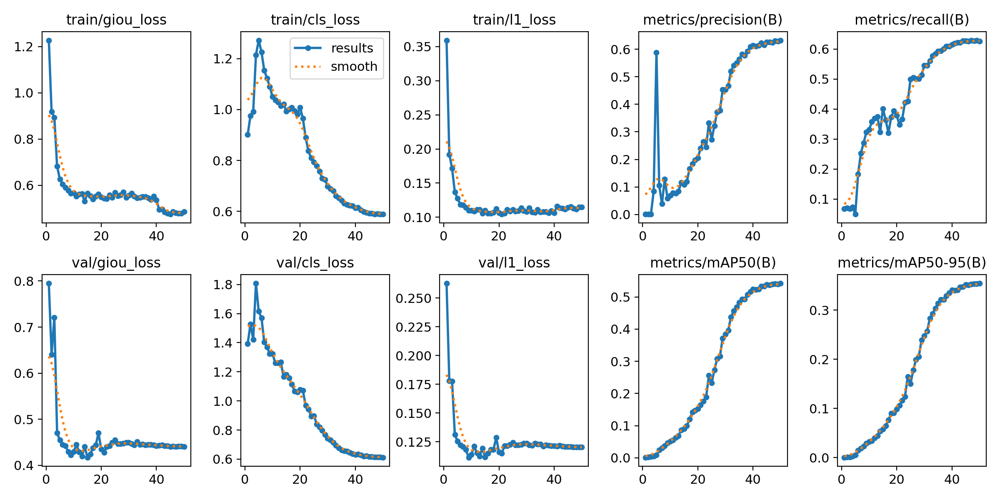


--- Confusion Matrix (Normalized) ---


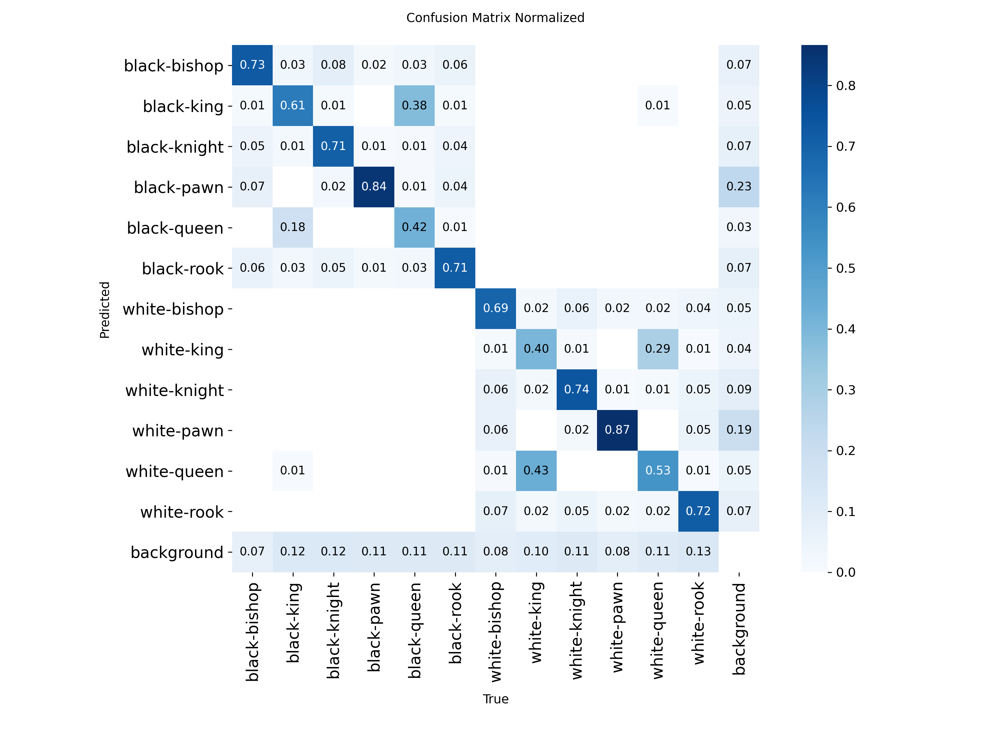


--- Dataset Labels ---


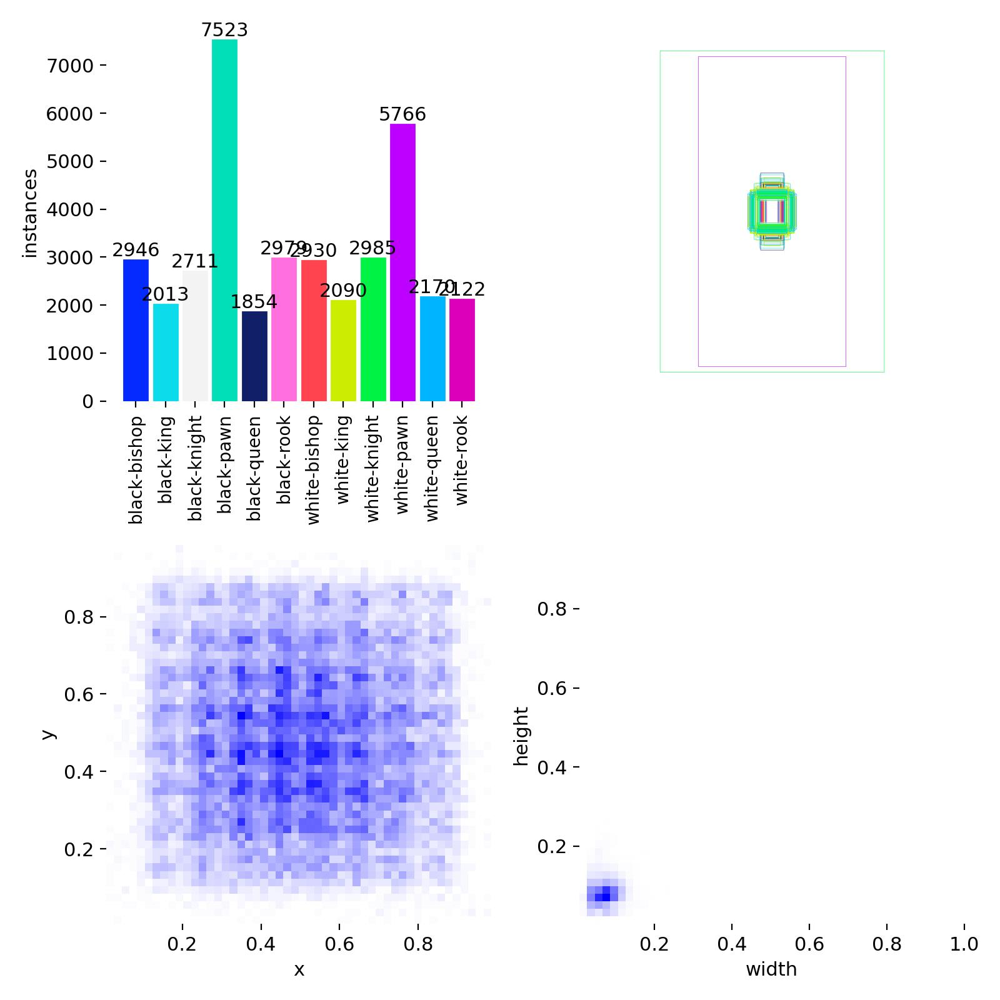


==================== 2. VISUAL PREDICTIONS (TEST SET) ====================


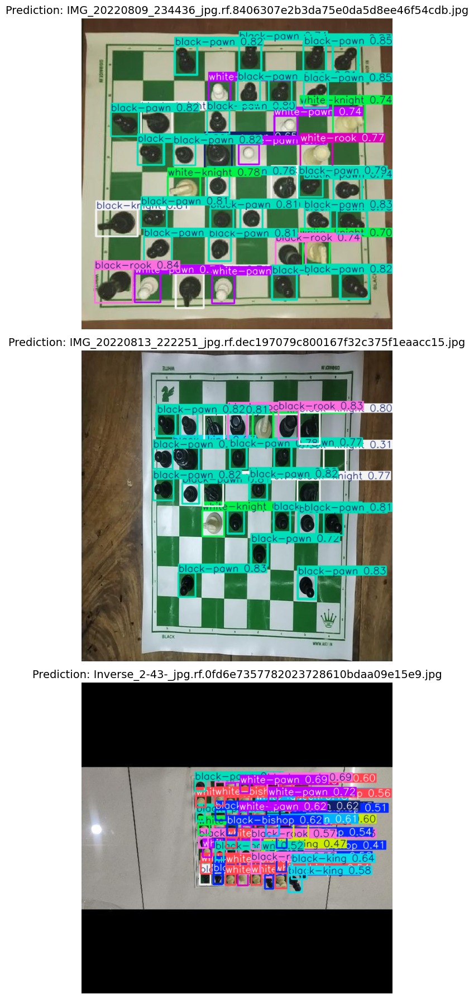

In [ ]:
if not os.path.exists('/content/drive'):
    drive.mount('/content/drive')

run_name = 'chess_rtdetr_l_20251231_1551' 

# Project root directory on Drive
drive_root = '/content/drive/MyDrive/Deep_Learning'

# Construct full paths
run_dir = os.path.join(drive_root, 'runs', run_name)
best_model_path = os.path.join(run_dir, 'weights', 'best.pt')

print(f"Inspecting results from: {run_dir}")

# Check if run directory exists
if not os.path.exists(run_dir):
    print(f"Error: The folder '{run_name}' was not found in {os.path.join(drive_root, 'runs')}")
    print("Please check the folder name in your Google Drive and update run_name.")
else:
    # Locate test images
    drive_test_search = os.path.join(drive_root, 'datasets', '*', 'test', 'images')
    found_drive_test = glob.glob(drive_test_search)

    if found_drive_test:
        test_images_path = found_drive_test[0]
        print(f"Test images found in Drive: {test_images_path}")
    else:
        # Fallback: local storage
        local_test_path = '/content/datasets/c1-zhnfm-1/test/images'
        if not os.path.exists(local_test_path):
            local_test_path = '/content/datasets/c1-zhnfm-1/valid/images'
        test_images_path = local_test_path

        if os.path.exists(test_images_path):
            print(f"Test images found locally: {test_images_path}")
        else:
            print("Error: Test images could not be found in Drive or local storage.")

    def display_training_metrics(): # Displays standard plots generated by Ultralytics during training.

        print("\n" + "=" * 20 + " 1. TRAINING METRICS " + "=" * 20)

        # Standard Ultralytics output plots
        plots_to_show = [
            ('results.png', 'Loss and Metrics Curves'),
            ('confusion_matrix_normalized.png', 'Confusion Matrix (Normalized)'),
            ('labels.jpg', 'Dataset Labels')
        ]

        for filename, title in plots_to_show:
            filepath = os.path.join(run_dir, filename)
            if os.path.exists(filepath):
                print(f"\n--- {title} ---")
                display(Image(filename=filepath, width=800))
            else:
                print(f"WARNING: {filename} was not found. It may only be generated at the end of training.")

    def run_visual_inference(num_images=3):
        
        print("\n" + "=" * 20 + " 2. VISUAL PREDICTIONS (TEST SET) " + "=" * 20)

        # Check if weights exist
        if not os.path.exists(best_model_path):
            print(f"Error: Best model weights not found at: {best_model_path}")
            return

        # The YOLO class can load RT-DETR weights for inference
        model = YOLO(best_model_path)

        # Collect test images
        all_images = glob.glob(f"{test_images_path}/*.jpg")

        if len(all_images) == 0:
            print(f"Error: No images found in {test_images_path}")
            return

        # Randomly select images
        selected_images = random.sample(all_images, min(len(all_images), num_images))

        # Run inference
        results = model.predict(
            source=selected_images,
            conf=0.25,
            iou=0.45,
            save=False,
            verbose=False
        )

        # Display predictions
        plt.figure(figsize=(15, 6 * num_images))

        for i, r in enumerate(results):
            im_bgr = r.plot(line_width=2, font_size=2)
            im_rgb = im_bgr[..., ::-1]  # Convert BGR to RGB

            plt.subplot(num_images, 1, i + 1)
            plt.imshow(im_rgb)
            plt.axis('off')
            plt.title(f"Prediction: {os.path.basename(selected_images[i])}", fontsize=14)

        plt.tight_layout()
        plt.show()

    display_training_metrics()
    run_visual_inference(num_images=3)


# Analyze Model Confidence

Loading model from: /content/drive/MyDrive/Deep_Learning/runs/chess_rtdetr_l_20251231_1551/weights/best.pt
Analyzing images in: /content/drive/MyDrive/Deep_Learning/datasets/c1-zhnfm-1/test/images
Processing 976 images sequentially to save memory...


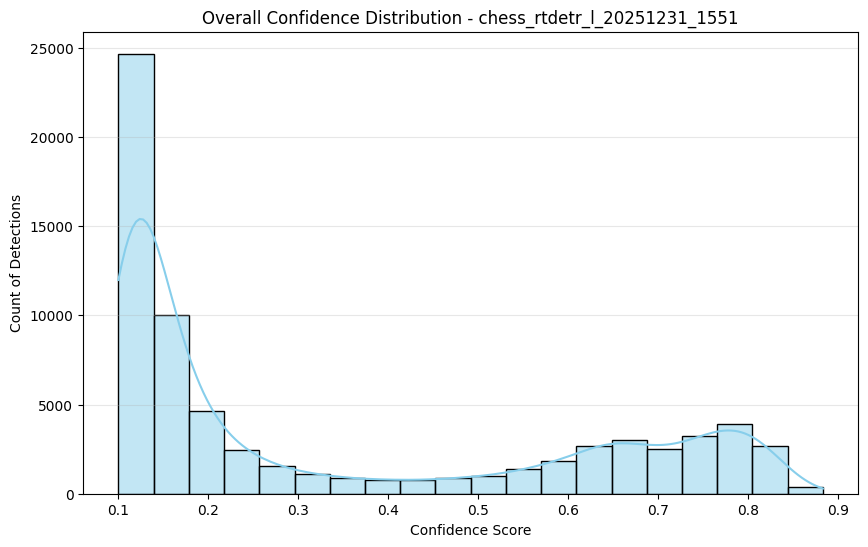



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



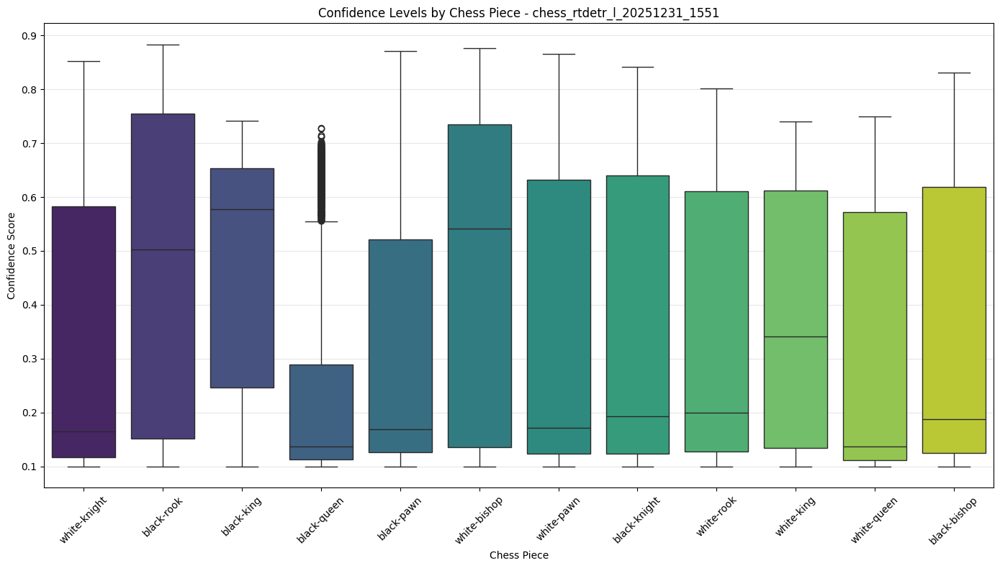

In [ ]:
run_name = 'chess_rtdetr_l_20251231_1551'

drive_root = '/content/drive/MyDrive/Deep_Learning'
run_dir = os.path.join(drive_root, 'runs', run_name)
best_model_path = os.path.join(run_dir, 'weights', 'best.pt')

# Locate Test Images
drive_test_search = os.path.join(drive_root, 'datasets', '*', 'test', 'images')
found_drive_test = glob.glob(drive_test_search)

if found_drive_test:
    test_image_dir = found_drive_test[0]
else:
    test_image_dir = '/content/datasets/c1-zhnfm-1/test/images'
    if not os.path.exists(test_image_dir):
        test_image_dir = '/content/datasets/c1-zhnfm-1/valid/images'

def plot_confidence_analysis(model_path, images_dir):
    # Clear Memory Before Starting
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        gc.collect()

    if not os.path.exists(model_path):
        print(f"Error: Model weights not found at {model_path}")
        return

    print(f"Loading model from: {model_path}")
    print(f"Analyzing images in: {images_dir}")

    # Load Model
    model = YOLO(model_path)
    image_files = glob.glob(f"{images_dir}/*.jpg")

    if not image_files:
        print("No images found.")
        return

    # Collect data
    all_confs = []
    all_classes = []

    print(f"Processing {len(image_files)} images sequentially to save memory...")

    # We loop through files manually to ensure memory is released after each image
    for i, img_path in enumerate(image_files):
        try:
            results = model.predict(img_path, conf=0.1, verbose=False, device=0)

            for r in results:
                if r.boxes:
                    confs = r.boxes.conf.cpu().numpy()
                    clss = r.boxes.cls.cpu().numpy().astype(int)
                    class_names = r.names

                    all_confs.extend(confs)
                    all_classes.extend([class_names[c] for c in clss])
        except Exception as e:
            print(f"Skipping image {i} due to error: {e}")
            continue

    # Create DataFrame for plotting
    df = pd.DataFrame({'Confidence': all_confs, 'Class': all_classes})

    if df.empty:
        print("No detections made on the test set.")
        return

    # Histogram
    plt.figure(figsize=(10, 6))
    sns.histplot(data=df, x='Confidence', bins=20, kde=True, color='skyblue')
    plt.title(f'Overall Confidence Distribution - {run_name}')
    plt.xlabel('Confidence Score')
    plt.ylabel('Count of Detections')
    plt.grid(axis='y', alpha=0.3)
    plt.show()

    # Boxplot
    plt.figure(figsize=(14, 8))
    sns.boxplot(data=df, x='Class', y='Confidence', palette='viridis')
    plt.xticks(rotation=45)
    plt.title(f'Confidence Levels by Chess Piece - {run_name}')
    plt.xlabel('Chess Piece')
    plt.ylabel('Confidence Score')
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

plot_confidence_analysis(best_model_path, test_image_dir)

# Advanced Evaluation

Analysis started for run: chess_rtdetr_l_20251231_1551
Model path: /content/drive/MyDrive/Deep_Learning/runs/chess_rtdetr_l_20251231_1551/weights/best.pt
Test Images: /content/drive/MyDrive/Deep_Learning/datasets/c1-zhnfm-1/test/images

Computing class-wise mAP...
Ultralytics 8.3.243 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (NVIDIA A100-SXM4-40GB, 40507MiB)
rt-detr-l summary: 310 layers, 32,008,400 parameters, 0 gradients, 103.5 GFLOPs
val: Fast image access ✅ (ping: 0.3±0.1 ms, read: 36.7±15.7 MB/s, size: 73.9 KB)
val: Scanning /content/drive/MyDrive/Deep_Learning/datasets/c1-zhnfm-1/test/labels.cache... 976 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 976/976 1.4Mit/s 0.0s
val: /content/drive/MyDrive/Deep_Learning/datasets/c1-zhnfm-1/test/images/IMG_20200909_000652_jpg.rf.915eb2770aef574ef4eae9a12de1e2b8.jpg: 2 duplicate labels removed
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 61/61 10.6it/s 5.7s
              



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



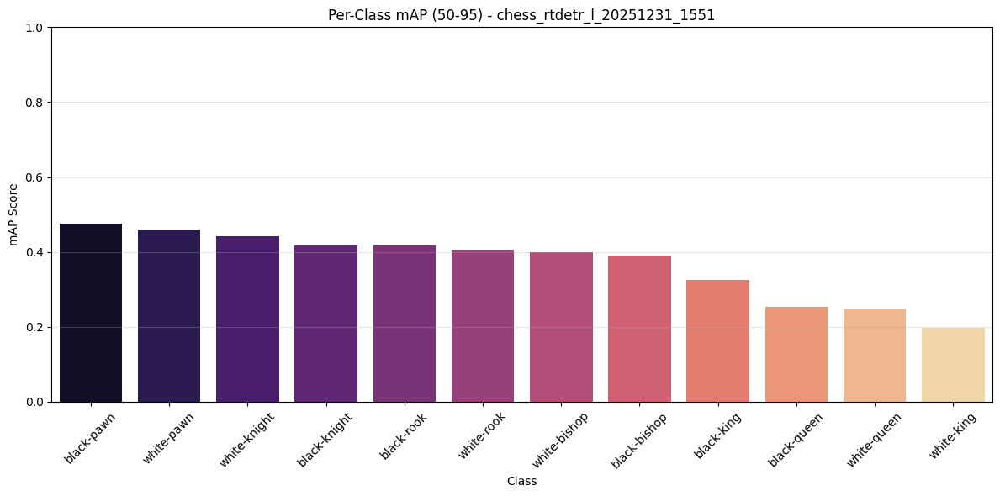


--- Confusion Matrix ---


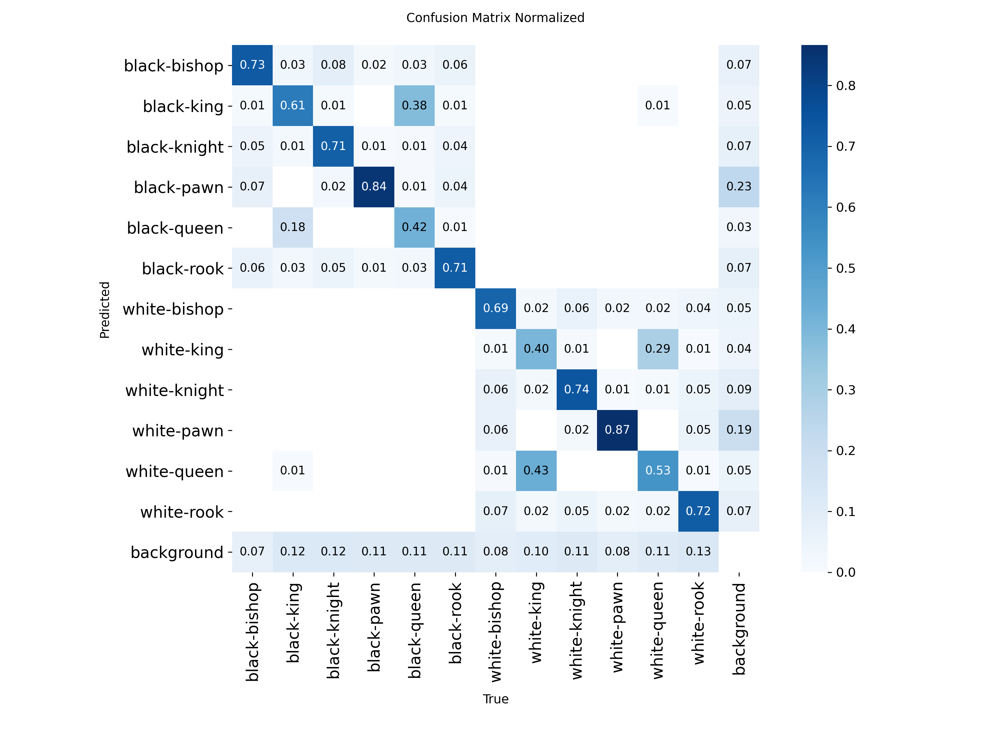


--- 1. Class Distribution Analysis (Ground Truth) ---




Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.



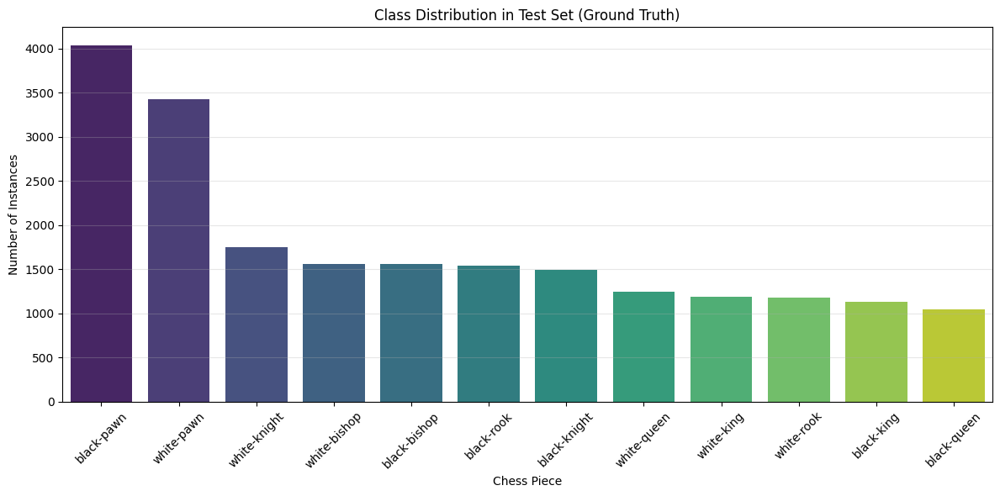


--- 2. Worst Predictions Gallery (Lowest Confidence) ---
Running sequential inference to find hard samples (Memory Safe)...
Plotting 6 worst cases...


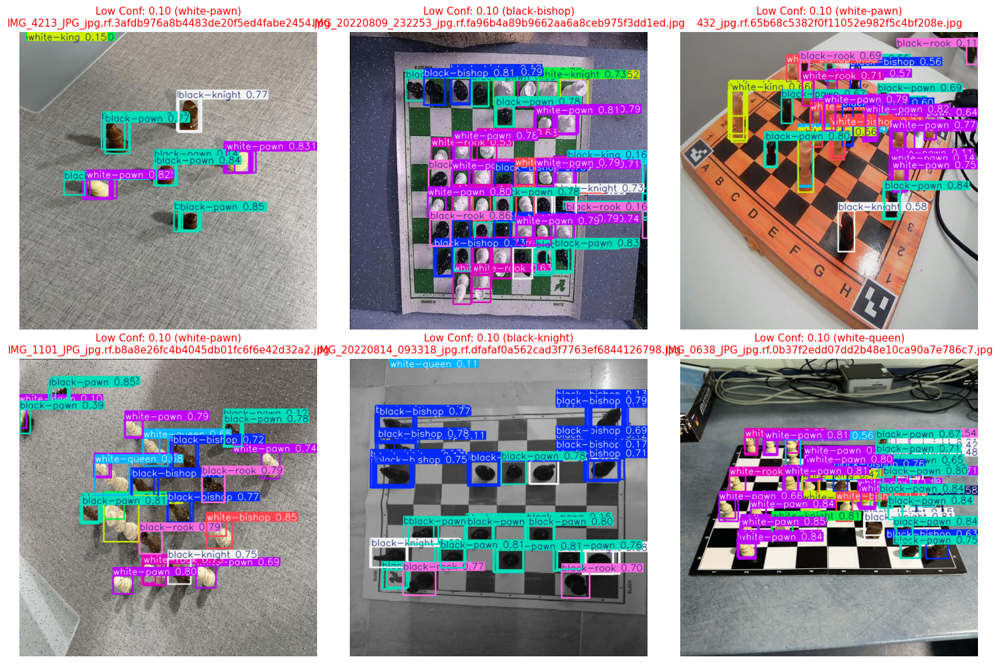

In [ ]:
run_name = 'chess_rtdetr_l_20251231_1551'

drive_root = '/content/drive/MyDrive/Deep_Learning'
run_dir = os.path.join(drive_root, 'runs', run_name)
best_model_path = os.path.join(run_dir, 'weights', 'best.pt')

# Locate Images and Labels
drive_test_search = os.path.join(drive_root, 'datasets', '*', 'test', 'images')
found_drive_test = glob.glob(drive_test_search)

if found_drive_test:
    test_image_dir = found_drive_test[0]
else:
    test_image_dir = '/content/datasets/c1-zhnfm-1/test/images'
    if not os.path.exists(test_image_dir):
        test_image_dir = '/content/datasets/c1-zhnfm-1/valid/images'

TEST_LABELS_DIR = test_image_dir.replace('images', 'labels')

print(f"Analysis started for run: {run_name}")
print(f"Model path: {best_model_path}")
print(f"Test Images: {test_image_dir}")

def analyze_class_distribution(class_names): # Analyzes and plots the class distribution from ground truth labels in the test set.

    print("\n1. Class Distribution Analysis (Ground Truth)")

    label_files = glob.glob(os.path.join(TEST_LABELS_DIR, "*.txt"))
    if not label_files:
        print("No label files found. Skipping distribution plot.")
        return

    class_counts = Counter()

    for lf in label_files:
        with open(lf, 'r') as f:
            lines = f.readlines()
            for line in lines:
                try:
                    cls_id = int(line.split()[0])
                    # Map ID to name using the model's class names
                    if cls_id < len(class_names):
                        class_counts[class_names[cls_id]] += 1
                except ValueError:
                    continue

    if not class_counts:
        print("No classes found in label files.")
        return

    # Create DataFrame
    df_dist = pd.DataFrame.from_dict(class_counts, orient='index', columns=['Count']).reset_index()
    df_dist.columns = ['Class', 'Count']
    df_dist = df_dist.sort_values('Count', ascending=False)

    # Plot
    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_dist, x='Class', y='Count', palette='viridis')
    plt.title('Class Distribution in Test Set (Ground Truth)')
    plt.xlabel('Chess Piece')
    plt.ylabel('Number of Instances')
    plt.xticks(rotation=45)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

def generate_advanced_plots():
    # Clear GPU memory before starting
    if torch.cuda.is_available():
        torch.cuda.empty_cache()
        gc.collect()

    if not os.path.exists(best_model_path):
        print("Model file not found.")
        return

    # Load Model
    model = YOLO(best_model_path)

    # Standard Metrics (mAP)
    print("\nComputing class-wise mAP")
    # Run validation
    metrics = model.val(
        data=os.path.join(os.path.dirname(os.path.dirname(test_image_dir)), 'data.yaml'),
        split='test',
        verbose=False,
        plots=False
    )

    if torch.cuda.is_available():
        torch.cuda.empty_cache()

    class_names = metrics.names
    map5095_per_class = metrics.box.maps

    df_map = pd.DataFrame({
        'Class': [class_names[i] for i in range(len(map5095_per_class))],
        'mAP 50-95': map5095_per_class
    }).sort_values('mAP 50-95', ascending=False)

    plt.figure(figsize=(12, 6))
    sns.barplot(data=df_map, x='Class', y='mAP 50-95', palette='magma')
    plt.title(f'Per-Class mAP (50-95) - {run_name}')
    plt.xlabel('Class')
    plt.ylabel('mAP Score')
    plt.xticks(rotation=45)
    plt.ylim(0, 1.0)
    plt.grid(axis='y', alpha=0.3)
    plt.tight_layout()
    plt.show()

    # Confusion Matrix
    conf_matrix_path = os.path.join(run_dir, 'confusion_matrix_normalized.png')
    if os.path.exists(conf_matrix_path):
        print("\n--- Confusion Matrix ---")
        display(Image(filename=conf_matrix_path, width=800))
        
    # Class Distribution
    analyze_class_distribution(class_names)


generate_advanced_plots()

## Visualize the Results on the Images we took

Loading models.
Models loaded successfully.
Found 12 images. Starting inference

Processing image 1/12: 20251219_101932.jpg


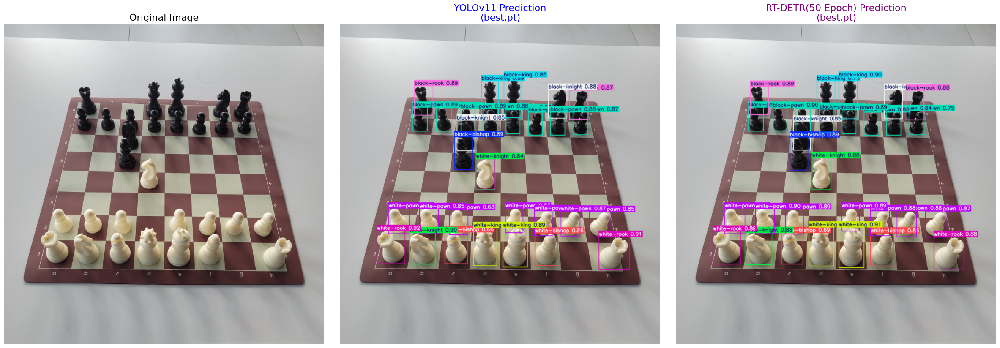

--------------------------------------------------------------------------------
Processing image 2/12: 20251219_101616.jpg


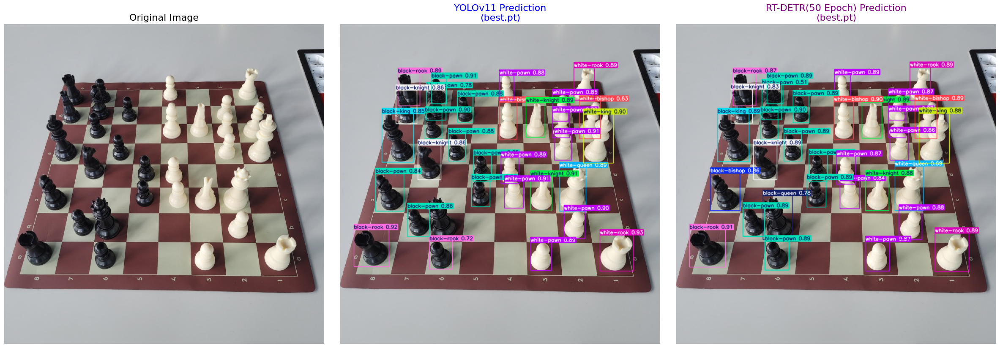

--------------------------------------------------------------------------------
Processing image 3/12: 20251219_101958.jpg


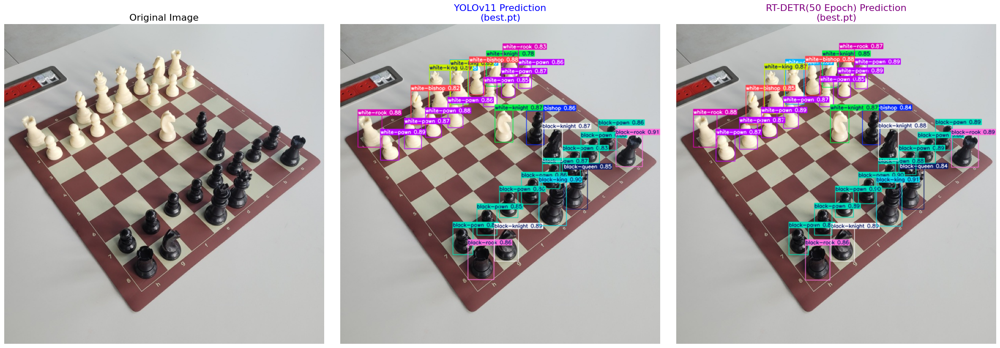

--------------------------------------------------------------------------------
Processing image 4/12: 20251219_103246.jpg


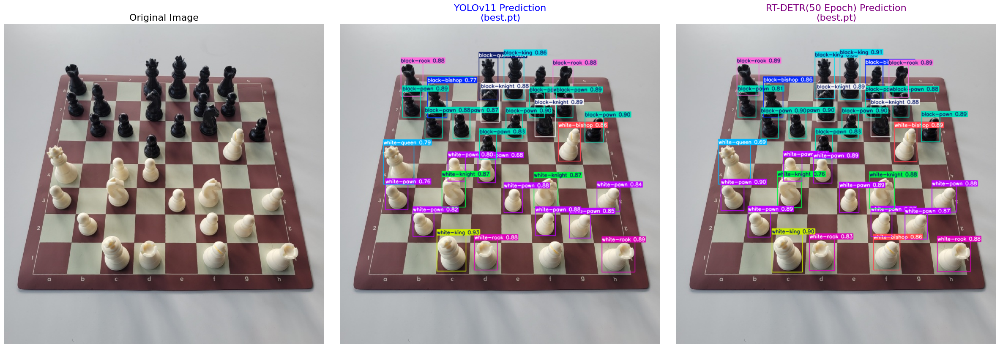

--------------------------------------------------------------------------------
Processing image 5/12: 20251219_111739.jpg


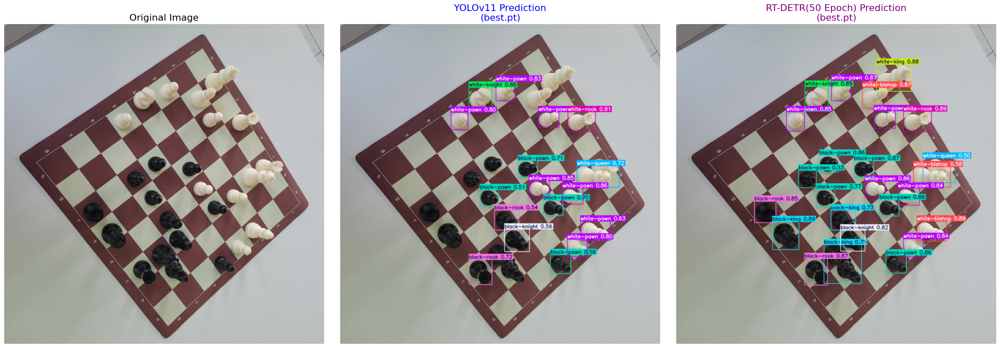

--------------------------------------------------------------------------------
Processing image 6/12: 20251219_112332.jpg


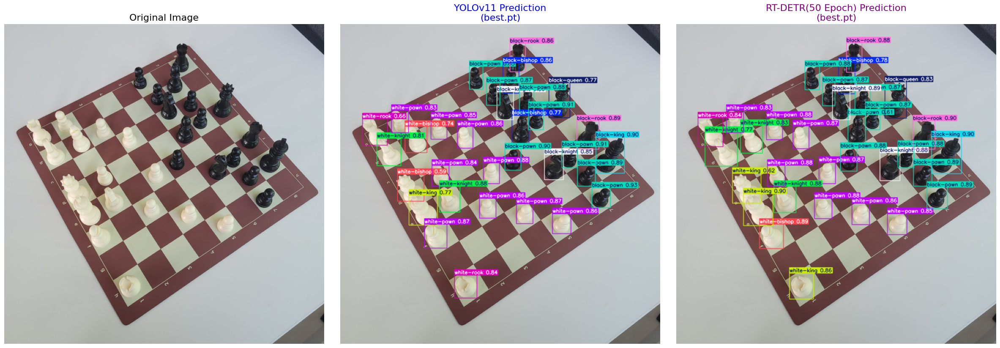

--------------------------------------------------------------------------------
Processing image 7/12: 20251219_112609.jpg


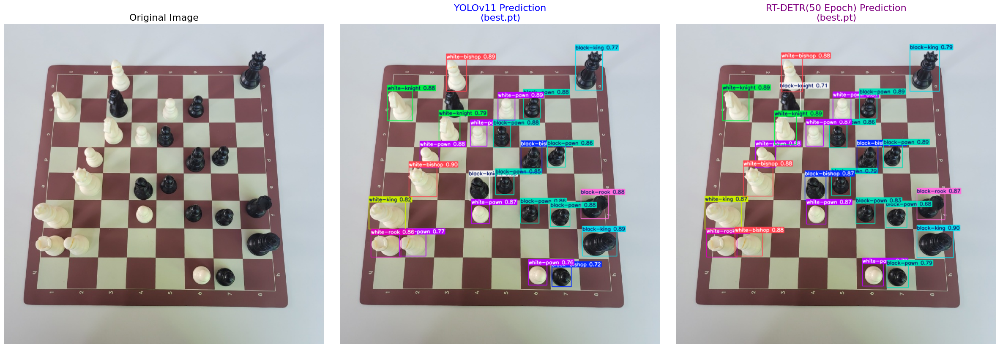

--------------------------------------------------------------------------------
Processing image 8/12: 20251219_112618.jpg


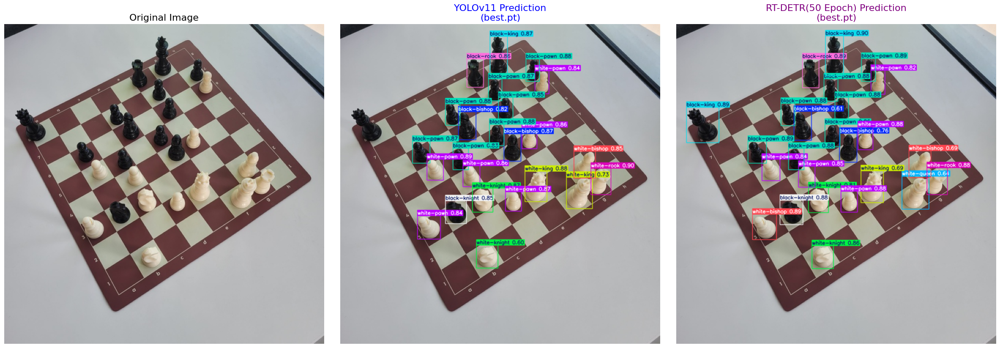

--------------------------------------------------------------------------------
Processing image 9/12: 20251219_113318.jpg


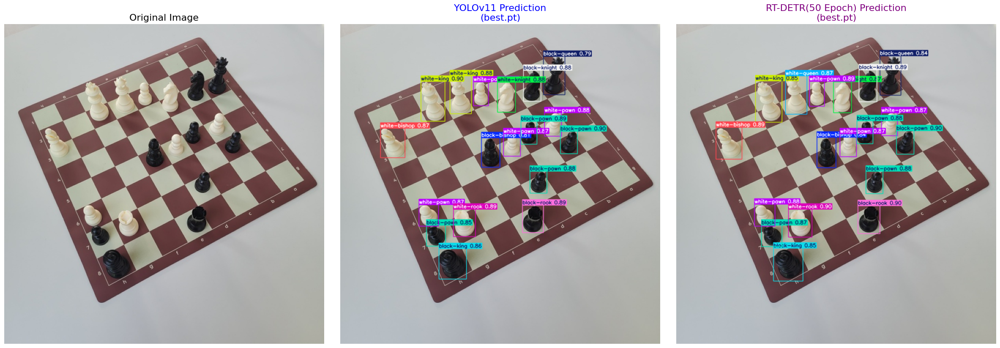

--------------------------------------------------------------------------------
Processing image 10/12: 20251219_113605.jpg


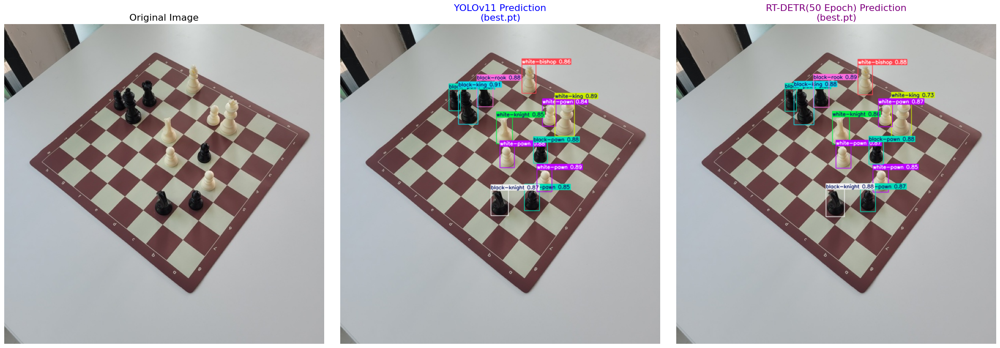

--------------------------------------------------------------------------------
Processing image 11/12: 20251219_113628.jpg


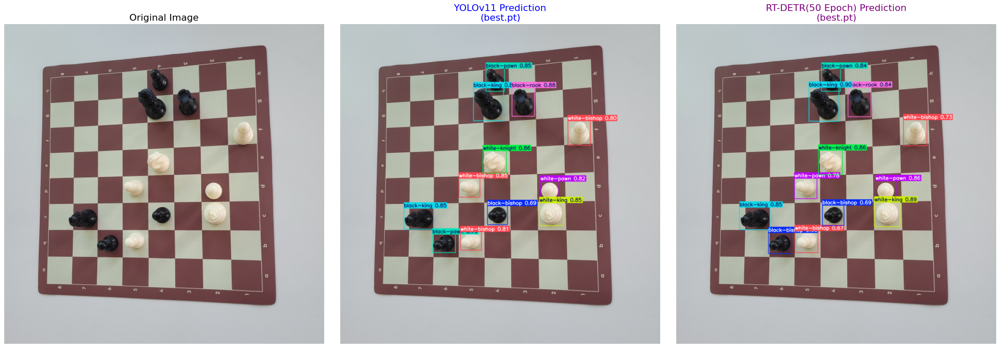

--------------------------------------------------------------------------------
Processing image 12/12: 20251219_113620.jpg


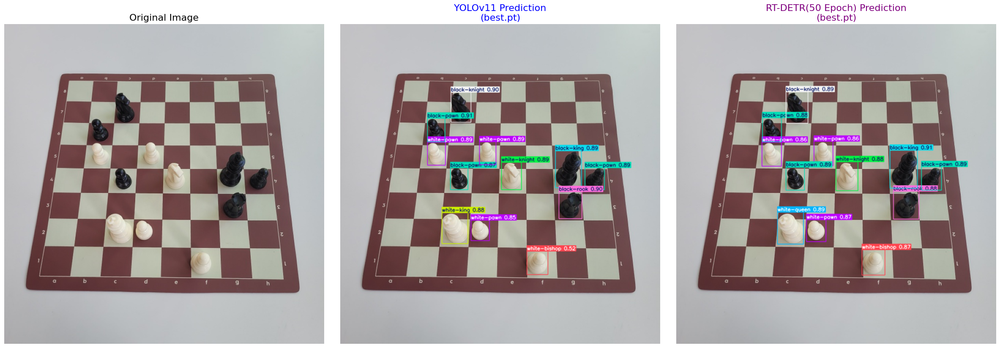

--------------------------------------------------------------------------------


In [ ]:
custom_images_path = '/content/drive/MyDrive/Deep_Learning/Custom_images'

yolo_weights_path = '/content/drive/MyDrive/Deep_Learning/runs/chess_yolo11s_fast_v1_20251224_1304/weights/best.pt'

detr_weights_path = '/content/drive/MyDrive/Deep_Learning/runs/chess_rtdetr_l_20251231_1551/weights/best.pt'

conf_threshold = 0.5


def run_comparative_inference():
    # Check paths
    if not os.path.exists(custom_images_path):
        print(f"Error: Image folder not found at {custom_images_path}")
        return
    if not os.path.exists(yolo_weights_path):
        print(f"Error: YOLO weights not found at {yolo_weights_path}")
        return
    if not os.path.exists(detr_weights_path):
        print(f"Error: DETR weights not found at {detr_weights_path}")
        return

    # Load Models
    print("Loading models.")
    try:
        yolo_model = YOLO(yolo_weights_path)

        try:
            detr_model = RTDETR(detr_weights_path)
        except:
            detr_model = YOLO(detr_weights_path) # Fallback

        print("Models loaded successfully.")
    except Exception as e:
        print(f"Error loading models: {e}")
        return

    # Get Images
    image_files = glob.glob(os.path.join(custom_images_path, "*.*"))
    # Filter for valid image extensions
    valid_exts = ['.jpg', '.jpeg']
    image_files = [f for f in image_files if os.path.splitext(f)[1].lower() in valid_exts]

    if not image_files:
        print(f" No images found in {custom_images_path}")
        return

    print(f"Found {len(image_files)} images. Starting inference\n")

    # Inference & Visualization Loop
    for i, img_path in enumerate(image_files):
        filename = os.path.basename(img_path)
        print(f"Processing image {i+1}/{len(image_files)}: {filename}")

        # Run Inference
        # device=0 ensures GPU usage
        yolo_results = yolo_model.predict(img_path, conf=conf_threshold, verbose=False, device=0)
        detr_results = detr_model.predict(img_path, conf=conf_threshold, verbose=False, device=0)

        # Plotting Setup (1 Row, 3 Columns)
        fig, axes = plt.subplots(1, 3, figsize=(24, 8))

        # A. Original Image (Read via matplotlib)
        img_original = plt.imread(img_path)
        axes[0].imshow(img_original)
        axes[0].set_title("Original Image", fontsize=16)
        axes[0].axis('off')

        # B. YOLO Prediction
        # plot() returns BGR numpy array, convert to RGB
        yolo_plot = yolo_results[0].plot(line_width=1, font_size=1)
        axes[1].imshow(yolo_plot[..., ::-1])
        axes[1].set_title(f"YOLOv11 Prediction\n({os.path.basename(yolo_weights_path)})", fontsize=16, color='blue')
        axes[1].axis('off')

        # RT-DETR Prediction
        detr_plot = detr_results[0].plot(line_width=1, font_size=1)
        axes[2].imshow(detr_plot[..., ::-1])
        axes[2].set_title(f"RT-DETR(50 Epoch) Prediction\n({os.path.basename(detr_weights_path)})", fontsize=16, color='purple')
        axes[2].axis('off')

        plt.tight_layout()
        plt.show()
        print("-" * 80)

run_comparative_inference()